In [94]:
%matplotlib inline
%load_ext watermark
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

import datetime
import platform
import pandas as pd
import numpy as np
import scipy as sp
import sklearn
import sys
from tqdm import tqdm
import nltk
import seaborn as sns
from nltk.stem import WordNetLemmatizer
from nltk.stem import WordNetLemmatizer as lemm, SnowballStemmer as stemm
from nltk.stem.porter import *
from nltk.corpus import stopwords
import gensim
from gensim.models.coherencemodel import CoherenceModel
from gensim.models import ldamodel
from gensim.models.ldamodel import LdaModel
from gensim.models import Phrases
from gensim.models.wrappers import LdaMallet
import gensim.corpora;
from gensim.corpora.dictionary import Dictionary
from gensim import corpora, models
from gensim.utils import simple_preprocess
import pyLDAvis.gensim; pyLDAvis.enable_notebook()
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.decomposition import LatentDirichletAllocation
from statsmodels.tsa.stattools import grangercausalitytests
from operator import itemgetter
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.preprocessing import normalize
from sklearn.utils import check_random_state
from sklearn.decomposition._online_lda_fast import _dirichlet_expectation_2d
import pyLDAvis.sklearn
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from keras.layers import Dense, LSTM
import pickle, string, re, time, os, io
from pprint import pprint
import base64
from io import BytesIO
import warnings
warnings.filterwarnings('ignore')
sns.set_context('poster')

%watermark -a 'Hanif' -d -t -v -p numpy,pandas,matplotlib,plotly,gensim,nltk,sklearn
system_info = platform.platform()
print(system_info)
print("Num of GPUs available: ", len(tf.test.gpu_device_name()))

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Author: Hanif

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.28.0

numpy     : 1.19.5
pandas    : 1.1.3
matplotlib: 3.3.2
plotly    : 4.14.1
gensim    : 3.8.3
nltk      : 3.5
sklearn   : 0.0

Linux-5.11.0-40-generic-x86_64-with-glibc2.17
Num of GPUs available:  13


2021-12-06 19:13:52.513263: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-06 19:13:52.541941: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-06 19:13:52.550865: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:03:00.0 name: NVIDIA GeForce 840M computeCapability: 5.0
coreClock: 1.124GHz coreCount: 3 deviceMemorySize: 1.96GiB deviceMemoryBandwidth: 14.92GiB/s
2021-12-06 19:13:52.577844: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-06 19:13:52.585931: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2021-12-06 19:13:52.586810: I tensorflow/stream_executor/platform/defau

In [37]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/hanif/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [11]:
# # Loading the data
start = time.time()
data = pd.read_csv("/home/hanif/indonesian_vaccination_tweets.csv", error_bad_lines=True)
start
data

,id,date,text,hashtags,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,source,retweets,favorites,is_retweet,reply_to_status
0,1348286903527768065,2021-01-10 15:13:42,#vaksin untuk #indonesia https://t.co/URgujrcKUn,"['vaksin', 'indonesia']",Ns. Bayu Aji Sismanto,"Bekasi, Jawa Barat",#nurseendoscopy #gastroenterology #pulmonology...,2012-04-22 04:00:39,214,627,1771,False,Twitter for Android,0,1,False,NaN
1,1348302168248340481,2021-01-10 16:14:21,Tak Kenal maka Tak Kebal. Vaksin menjadi bukti...,NaN,DiskominfoKotaBogor,Kota Bogor - Jawa Barat,Akun twitter resmi Dinas Komunikasi dan Inform...,2014-05-06 02:08:47,4617,203,38,False,Twitter for iPhone,0,0,False,NaN
2,1348307055040348160,2021-01-10 16:33:46,Sistem satu data mendukung Vaksinasi di Indone...,"['Vaksin', 'Covid19', 'CoronaVirus', 'Kesehatan']",Indah Nur Hidayah,NaN,NaN,2020-11-25 03:24:19,10,22,38,False,Twitter Web App,0,0,False,NaN
3,1348322660925669377,2021-01-10 17:35:47,https://t.co/Te1d94JHHM\nSiap menerima vaksin ...,"['vaksinhalal', 'vaksinsiap34propinsi', 'vaksi...",lemahku,NaN,"lemahku, dark side, toxic, and anything negati...",2020-11-30 13:07:42,3,158,10,False,Twitter for Android,0,0,False,NaN
4,1348425614584266753,2021-01-11 00:24:53,Apa Perbedaan Vaksin China Sinovac dan Sinopha...,"['Vaksin', 'Perusahaanfarmasi', 'Virus', 'Farm...",BaBe - Baca Berita,Indonesia,Aku resmi BaBe - Aplikasi berita pintar yang m...,2014-01-23 08:06:14,5128,48,95,False,BaBe,0,0,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13486,1384533013568974856,2021-04-20 15:42:48,Wah @bank_sinarmas dan @as_sinarmas hebat juga...,['tegal'],Seputar Kota Tegal,"Tegal Timur, Indonesia","Kota Tegal ""New Normal"" senyum cerah terlihat...",2020-02-23 09:15:00,56,474,11,False,Twitter for iPhone,0,0,False,NaN
13487,1384582641664544769,2021-04-20 19:00:00,Kunci Pemulihan Ekonomi adalah Ketersediaan Va...,NaN,Mata Milenial Indonesia,"Jakarta, Indonesia",Megaportal berbasis media online dan tv stream...,2018-09-14 03:57:54,362,19,779,False,TweetDeck,0,2,False,NaN
13488,1384607207564595201,2021-04-20 20:37:37,#bandartogelonline #bocorantogel #angkajitu #p...,"['bandartogelonline', 'bocorantogel', 'angkaji...",Bandar Togel Online | Live casino Online Resmi,NaN,kunjungi web kami https://t.co/uzorzBuGri\n◘Di...,2020-09-25 20:04:29,217,1028,692,False,Twitter Web App,0,1,False,NaN
13489,1384609537689231363,2021-04-20 20:46:53,Kepada seluruh wanita Indonesia \n\nSELAMAT HA...,"['kapoldajatim', 'poldajatim', 'polwanjatim', ...",Polsek Tandes Sby,"Kota Surabaya, Jawa Timur",NaN,2016-09-17 03:59:41,218,32,4,False,Twitter for Android,0,0,False,NaN


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13491 entries, 0 to 13490
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                13491 non-null  int64  
 1   date              13491 non-null  object 
 2   text              13491 non-null  object 
 3   hashtags          9134 non-null   object 
 4   user_name         13491 non-null  object 
 5   user_location     8498 non-null   object 
 6   user_description  11949 non-null  object 
 7   user_created      13491 non-null  object 
 8   user_followers    13491 non-null  int64  
 9   user_friends      13491 non-null  int64  
 10  user_favourites   13491 non-null  int64  
 11  user_verified     13491 non-null  bool   
 12  source            13488 non-null  object 
 13  retweets          13491 non-null  int64  
 14  favorites         13491 non-null  int64  
 15  is_retweet        13491 non-null  bool   
 16  reply_to_status   1190 non-null   float6

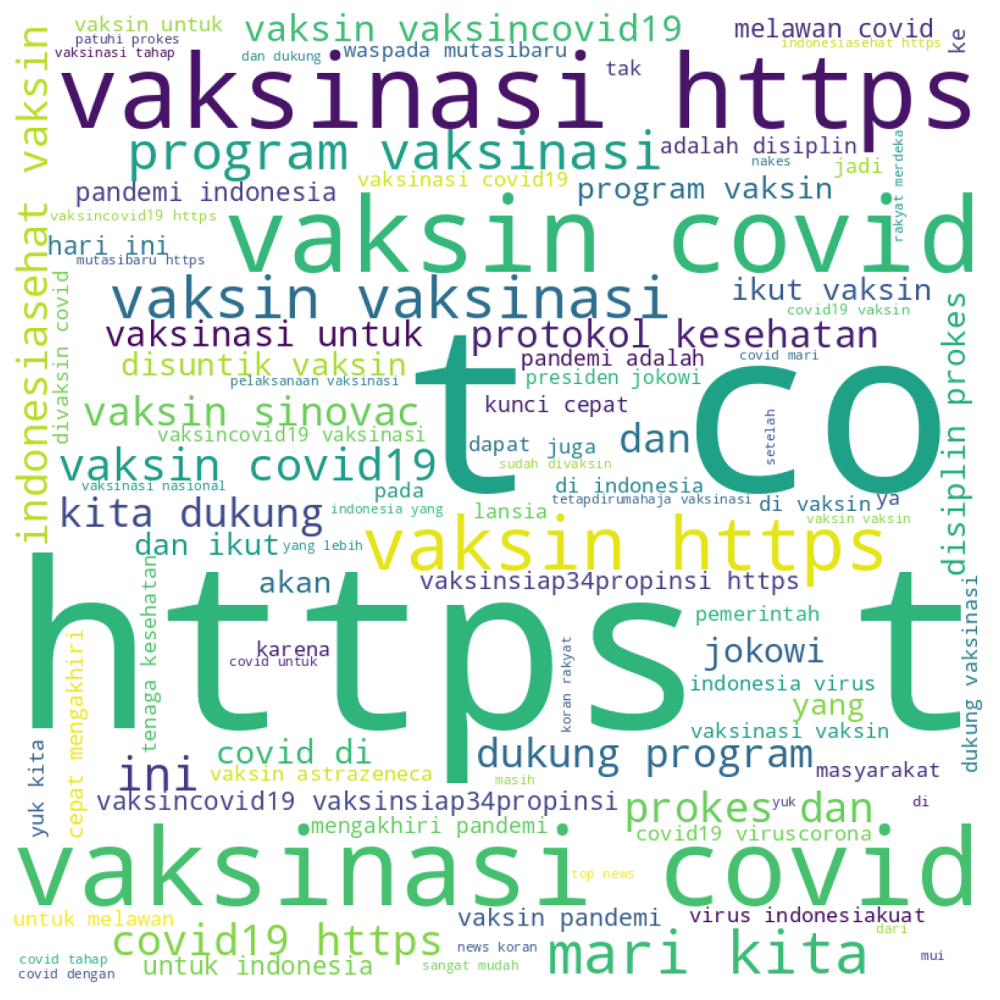

In [19]:
comment_words = ''
 
# iterate through the csv file
for val in data.text:
     
    # typecaste each val to string
    val = str(val)
 
    # split the value
    tokens = val.split()
     
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
     
    comment_words += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [23]:
data.retweets.value_counts()

0      11697
1        893
2        310
3        223
4        118
5         57
7         24
6         22
10        16
8         14
11        12
9         11
15         8
14         7
12         6
19         6
17         5
13         5
28         4
20         4
16         3
31         3
21         2
18         2
23         2
59         2
34         2
41         2
29         2
224        1
117        1
133        1
22         1
384        1
44         1
96         1
72         1
48         1
40         1
24         1
246        1
830        1
25         1
93         1
57         1
65         1
36         1
37         1
26         1
42         1
50         1
172        1
211        1
124        1
68         1
60         1
52         1
83         1
Name: retweets, dtype: int64

In [24]:
order = data.retweets.value_counts(ascending=True).index
order

Int64Index([ 83,  52,  60,  68, 124, 211, 172,  50,  42,  26,  37,  36,  65,
             57,  93,  25, 830, 246,  24,  40,  48,  72,  96,  44, 384,  22,
            133, 117, 224,  29,  41,  34,  59,  23,  18,  21,  31,  16,  20,
             28,  13,  17,  19,  12,  14,  15,   9,  11,   8,  10,   6,   7,
              5,   4,   3,   2,   1,   0],
           dtype='int64')

<AxesSubplot:xlabel='count', ylabel='retweets'>

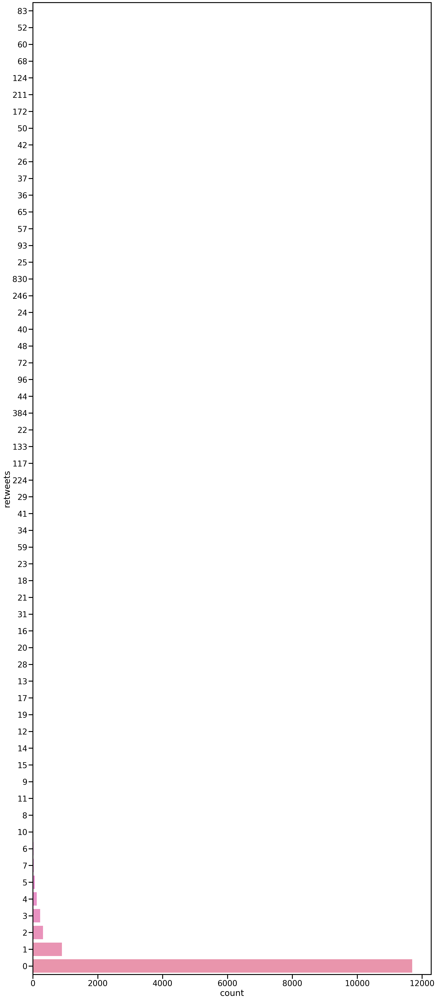

In [25]:
plt.figure(figsize=(20,50))
sns.countplot(y='retweets', data=data, orient='h', order=order)

In [29]:
pd.crosstab(data.retweets, data.date)

date,2021-01-10 15:13:42,2021-01-10 16:14:21,2021-01-10 16:33:46,2021-01-10 17:35:47,2021-01-11 00:24:53,2021-01-11 00:30:53,2021-01-11 01:00:00,2021-01-11 01:07:10,2021-01-11 01:41:53,2021-01-11 01:59:25,...,2021-04-20 14:00:15,2021-04-20 14:06:05,2021-04-20 14:20:44,2021-04-20 14:28:47,2021-04-20 15:41:40,2021-04-20 15:42:48,2021-04-20 19:00:00,2021-04-20 20:37:37,2021-04-20 20:46:53,2021-04-20 23:36:34
retweets,,,,,,,,,,,,,,,,,,,,,
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
#We only need the Headlines_text column from the data
data_text = data[['text']]
datanggal = data[['date']]
data_tgl = np.unique(np.array([ii[:10] for ii in datanggal['date']]))
print(data_text)
print(data_tgl)

                                                    text
0       #vaksin untuk #indonesia https://t.co/URgujrcKUn
1      Tak Kenal maka Tak Kebal. Vaksin menjadi bukti...
2      Sistem satu data mendukung Vaksinasi di Indone...
3      https://t.co/Te1d94JHHM\nSiap menerima vaksin ...
4      Apa Perbedaan Vaksin China Sinovac dan Sinopha...
...                                                  ...
13486  Wah @bank_sinarmas dan @as_sinarmas hebat juga...
13487  Kunci Pemulihan Ekonomi adalah Ketersediaan Va...
13488  #bandartogelonline #bocorantogel #angkajitu #p...
13489  Kepada seluruh wanita Indonesia \n\nSELAMAT HA...
13490  Mungkin ini informasi penting untuk diketahui ...

[13491 rows x 1 columns]
['2021-01-10' '2021-01-11' '2021-01-12' '2021-01-13' '2021-01-14'
 '2021-01-15' '2021-01-16' '2021-01-17' '2021-01-18' '2021-01-19'
 '2021-01-20' '2021-01-21' '2021-01-22' '2021-01-23' '2021-01-24'
 '2021-01-25' '2021-01-26' '2021-01-27' '2021-01-28' '2021-01-29'
 '2021-01-30' '2021-01-31'

In [35]:
# We need to remove stopwords first. Casting all values to float will make it easier to iterate over.
data_text = data_text.astype('str')
print(data_text)

                                                    text
0       #vaksin untuk #indonesia https://t.co/URgujrcKUn
1      Tak Kenal maka Tak Kebal. Vaksin menjadi bukti...
2      Sistem satu data mendukung Vaksinasi di Indone...
3      https://t.co/Te1d94JHHM\nSiap menerima vaksin ...
4      Apa Perbedaan Vaksin China Sinovac dan Sinopha...
...                                                  ...
13486  Wah @bank_sinarmas dan @as_sinarmas hebat juga...
13487  Kunci Pemulihan Ekonomi adalah Ketersediaan Va...
13488  #bandartogelonline #bocorantogel #angkajitu #p...
13489  Kepada seluruh wanita Indonesia \n\nSELAMAT HA...
13490  Mungkin ini informasi penting untuk diketahui ...

[13491 rows x 1 columns]


In [38]:
for idx in range(len(data_text)):
    listing = []
    #go through each word in each data_text row, remove stopwords, and set them on the index.
    for word in data_text.iloc[idx]['text'].split(' '):
        if "http" not in word:
            if "@" not in word:
                if "#" not in word:                        
                    if word not in stopwords.words('indonesian'):
                        if word.isalpha():
                            if len(word) > 2:
                                listing.append(word)
    data_text.iloc[idx]['text'] = listing
    #print logs to monitor output
    if idx % 100 == 0:
        sys.stdout.write('\rc = ' + str(idx) + ' / ' + str(len(data_text)));

print(data_text)

c = 13400 / 13491                                                    text
0                                                     []
1      [Tak, Kenal, Tak, Vaksin, bukti, manusia, berj...
2        [Sistem, data, mendukung, Vaksinasi, Indonesia]
3                              [menerima, vaksin, covid]
4      [Apa, Perbedaan, Vaksin, China, Sinovac, Sinop...
...                                                  ...
13486     [Wah, hebat, idenya, ngadain, seminar, bareng]
13487  [Kunci, Pemulihan, Ekonomi, Ketersediaan, sele...
13488                                                 []
13489                  [Kepada, wanita, Indonesia, HARI]
13490                      [Mungkin, informasi, kondisi]

[13491 rows x 1 columns]


In [39]:
#save data because it takes very long to remove stop words
pickle.dump(data_text, open('data_text.dat', 'wb'))

In [40]:
#get the words as an array for LDA input
train_komen = [value[0] for value in data_text.iloc[0:].values];
print('train_komen',train_komen)
print(len(train_komen))

train_komen [[], ['Tak', 'Kenal', 'Tak', 'Vaksin', 'bukti', 'manusia', 'berjuang', 'menjaga', 'eksistensinya', 'dunia', 'Vaksin'], ['Sistem', 'data', 'mendukung', 'Vaksinasi', 'Indonesia'], ['menerima', 'vaksin', 'covid'], ['Apa', 'Perbedaan', 'Vaksin', 'China', 'Sinovac', 'Sinopharm', 'Merek'], ['Dua', 'Lagi', 'Obat', 'Dapat', 'Selamatkan', 'Nyawa', 'Pasien', 'Ditemukan'], ['Vaksin', 'buatan', 'Tiongkok', 'orang', 'tua', 'video', 'selengkapnya'], ['Kabar', 'Dokter', 'Pribadi', 'Paus', 'Fransiskus', 'Meninggal', 'Akibat'], ['Masker', 'bekas', 'rawan', 'tertular', 'Pakai', 'masker', 'utk', 'mencegah', 'maksimal', 'penularan', 'virus'], ['wakil', 'supervisor', 'rumah', 'sakit'], ['Mengenal', 'Vaksin'], ['Top', 'News', 'Koran', 'Rakyat', 'Imlek', 'Target', 'Juta', 'Warga', 'Sudah'], ['Lawan'], ['Vaksinasi', 'jaga', 'protokol'], ['Sampurasun', 'wargi', 'jabar', 'wargi', 'lihat', 'daftar', 'penyakit', 'terima', 'vaksin', 'sinovac'], ['Aceh', 'Salah', 'Satu', 'Provinsi', 'Yang', 'Menerapkan'

In [41]:
# Create Bigram & Trigram Models
bigram = gensim.models.Phrases(train_komen, min_count=5, threshold=100)
trigram = gensim.models.Phrases(bigram[train_komen], threshold=100)

for idx in range(len(train_komen)):
    for token in bigram[train_komen[idx]]:
        if '_' in token:
            # token is a bigram, add to document.
            train_komen[idx].append(token)
    for token in trigram[train_komen[idx]]:
        if '_' in token:
            train_komen[idx].append(token)

In [42]:
train_komen

[[],
 ['Tak',
  'Kenal',
  'Tak',
  'Vaksin',
  'bukti',
  'manusia',
  'berjuang',
  'menjaga',
  'eksistensinya',
  'dunia',
  'Vaksin'],
 ['Sistem', 'data', 'mendukung', 'Vaksinasi', 'Indonesia'],
 ['menerima', 'vaksin', 'covid'],
 ['Apa', 'Perbedaan', 'Vaksin', 'China', 'Sinovac', 'Sinopharm', 'Merek'],
 ['Dua',
  'Lagi',
  'Obat',
  'Dapat',
  'Selamatkan',
  'Nyawa',
  'Pasien',
  'Ditemukan'],
 ['Vaksin',
  'buatan',
  'Tiongkok',
  'orang',
  'tua',
  'video',
  'selengkapnya',
  'orang_tua',
  'video_selengkapnya',
  'orang_tua',
  'video_selengkapnya',
  'orang_tua',
  'video_selengkapnya'],
 ['Kabar', 'Dokter', 'Pribadi', 'Paus', 'Fransiskus', 'Meninggal', 'Akibat'],
 ['Masker',
  'bekas',
  'rawan',
  'tertular',
  'Pakai',
  'masker',
  'utk',
  'mencegah',
  'maksimal',
  'penularan',
  'virus',
  'Pakai_masker',
  'Pakai_masker',
  'Pakai_masker'],
 ['wakil',
  'supervisor',
  'rumah',
  'sakit',
  'rumah_sakit',
  'rumah_sakit',
  'rumah_sakit'],
 ['Mengenal', 'Vaksin']

In [43]:
## membuat dictionary dari text
dictionary = gensim.corpora.Dictionary(train_komen)
dictionary.filter_extremes(no_below=5, no_above=0.2)
print(dictionary)

Dictionary(2875 unique tokens: ['Tak', 'Vaksin', 'bukti', 'dunia', 'manusia']...)


In [44]:
# mengonversi corpus ke dalam bentuk dokument term matrix menggunakan dictionary
doc_term_matrix = [dictionary.doc2bow(doc) for doc in train_komen]
# convert into the bag-of-words format
print(len(doc_term_matrix))
print(doc_term_matrix[100])
tfidf = models.TfidfModel(doc_term_matrix) # build TF-IDF model
corpus_tfidf = tfidf[doc_term_matrix]
corpus_tfidf

13491
[(13, 1), (92, 1), (119, 1), (242, 1), (243, 1), (281, 1), (295, 3), (331, 1)]


In [45]:
doc_term_matrix

[[],
 [(0, 2), (1, 2), (2, 1), (3, 1), (4, 1), (5, 1)],
 [(6, 1), (7, 1), (8, 1), (9, 1), (10, 1)],
 [(11, 1), (12, 1), (13, 1)],
 [(1, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1)],
 [(20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1)],
 [(1, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 3),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 3)],
 [(35, 1), (36, 1), (37, 1), (38, 1)],
 [(39, 1),
  (40, 1),
  (41, 3),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1)],
 [(48, 1), (49, 3), (50, 1), (51, 1)],
 [(1, 1)],
 [(52, 1),
  (53, 1),
  (54, 2),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 2),
  (61, 1),
  (62, 1)],
 [(63, 1)],
 [(8, 1), (64, 1), (65, 1)],
 [(13, 1),
  (66, 1),
  (67, 3),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 2)],
 [(74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 1)],
 [(13, 1), (42, 1), (65, 1), (88,

In [46]:
dict_corpus = {}

for i in range(len(corpus_tfidf)):
  for idx, freq in corpus_tfidf[i]:
    if dictionary[idx] in dict_corpus:
      dict_corpus[dictionary[idx]] += freq
    else:
       dict_corpus[dictionary[idx]] = freq
       
dict_df = pd.DataFrame.from_dict(dict_corpus, orient='index', columns=['freq'])

<AxesSubplot:xlabel='freq', ylabel='Density'>

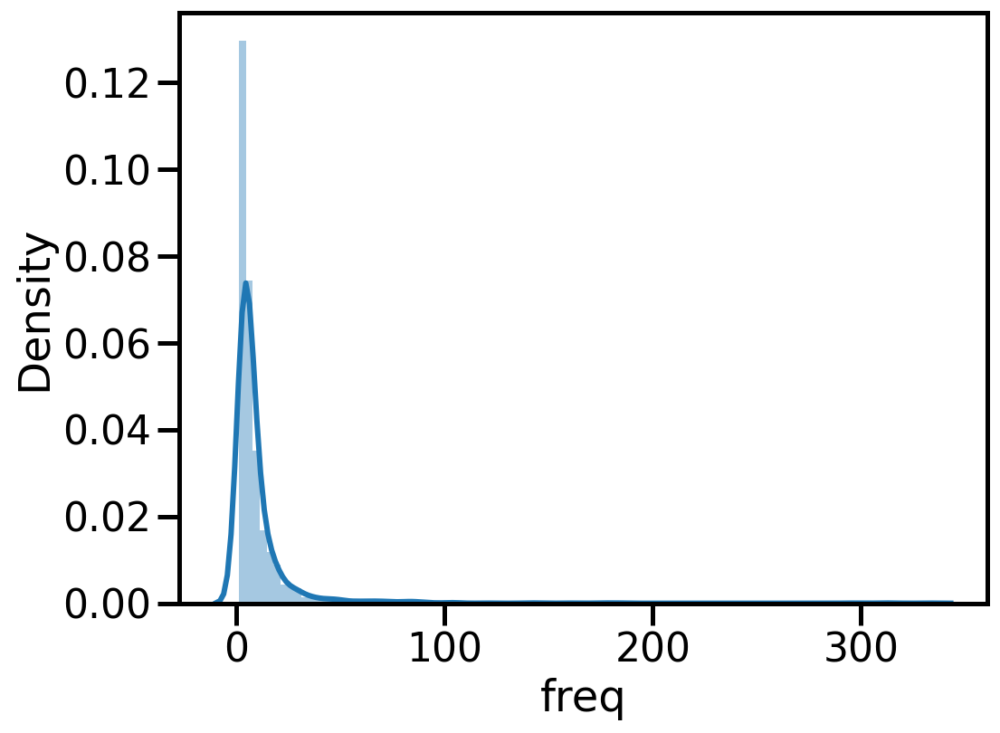

In [47]:
plt.figure(figsize=(8,6))
sns.distplot(dict_df['freq'], bins=100)

In [48]:
dict_df.sort_values('freq', ascending=False).head(10)

,freq
vaksin,332.180862
Vaksin,314.994078
Vaksinasi,309.842248
vaksinasi,294.960790
program,184.060166
Indonesia,179.231167
dukung,174.114652
mari,159.474026
kesehatan,143.346227
Adalah_Prokes,140.321894


In [49]:
extension = dict_df[dict_df.freq>300].index.tolist()

In [50]:
extension

['Vaksin', 'Vaksinasi', 'vaksin']

In [51]:
ids=[dictionary.token2id[extension[i]] for i in range(len(extension))]
dictionary.filter_tokens(bad_ids=ids)

In [54]:
print('Total Vocabulary Size:', len(dictionary))

Total Vocabulary Size: 2872


In [55]:
# Create Corpus: Term Document Frequency
corpus = [dictionary.doc2bow(text) for text in train_komen]

In [56]:
print(len(corpus))
print(corpus[100])
tfidf = models.TfidfModel(corpus) # build TF-IDF model
corpus_tfidf = tfidf[corpus]
corpus_tfidf

13491
[(89, 1), (116, 1), (239, 1), (240, 1), (278, 1), (292, 3), (328, 1)]


In [57]:
#kelompokkan komentar berdasar tanggal
harian = []
for tgl in data_tgl:
    harini = [train_komen[ii] for ii in range(len(datanggal)) if datanggal.iloc[ii]['date'][:10] == tgl]
    harian.append(harini)
    print(len(harini))

4
124
253
728
386
246
137
96
137
125
121
114
129
96
56
198
177
215
182
152
133
110
115
139
111
86
74
67
73
131
111
129
80
117
67
93
124
1
175
146
106
110
98
112
167
212
181
236
83
143
162
171
238
186
156
122
87
141
160
212
87
123
107
112
142
190
297
159
201
100
90
140
209
174
122
150
105
108
120
123
119
86
64
98
69
123
104
127
141
99
76
72
74
83
128
66
31
140
91


In [58]:
#number of topics we will cluster for: 5
num_topics = 10

In [59]:
# # LDA
# For LDA, we need to obtain a design matrix. To improve results, I am going to apply TfIdf transformation to the counts.

#the count vectorizer needs string inputs, not array, so I join them with a space.
#train_headlines_sentences = [' '.join(text) for text in train_headlines]
train_headlines_sentens = [[' '.join(text) for text in harini] for harini in harian]
print('\n','train_headlines_sentences',train_headlines_sentens)


 train_headlines_sentences [['', 'Tak Kenal Tak Vaksin bukti manusia berjuang menjaga eksistensinya dunia Vaksin', 'Sistem data mendukung Vaksinasi Indonesia', 'menerima vaksin covid'], ['Apa Perbedaan Vaksin China Sinovac Sinopharm Merek', 'Dua Lagi Obat Dapat Selamatkan Nyawa Pasien Ditemukan', 'Vaksin buatan Tiongkok orang tua video selengkapnya orang_tua video_selengkapnya orang_tua video_selengkapnya orang_tua video_selengkapnya', 'Kabar Dokter Pribadi Paus Fransiskus Meninggal Akibat', 'Masker bekas rawan tertular Pakai masker utk mencegah maksimal penularan virus Pakai_masker Pakai_masker Pakai_masker', 'wakil supervisor rumah sakit rumah_sakit rumah_sakit rumah_sakit', 'Mengenal Vaksin', 'Top News Koran Rakyat Imlek Target Juta Warga Sudah Top_News Koran_Rakyat Top_News Koran_Rakyat Top_News_Koran_Rakyat', 'Lawan', 'Vaksinasi jaga protokol', 'Sampurasun wargi jabar wargi lihat daftar penyakit terima vaksin sinovac Sampurasun_wargi Sampurasun_wargi Sampurasun_wargi', 'Aceh Sala

In [60]:
#get the words as an array for LDA input
lda = ldamodel.LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=num_topics);

In [61]:
def get_lda_topics(model, num_topics):
    word_dict = {}
    for i in range(num_topics):
        words = model.show_topic(i, topn = 10);
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = [i[0] for i in words]
    return pd.DataFrame(word_dict)

In [62]:
get_lda_topics(lda, num_topics)

,Topic # 01,Topic # 02,Topic # 03,Topic # 04,Topic # 05,Topic # 06,Topic # 07,Topic # 08,Topic # 09,Topic # 10
0,Tetap,Jangan,mari,Bulan,Adalah_Prokes,Ayo,Waspada,indonesia,Saya,AstraZeneca
1,kesehatan,takut,dukung,ancaman,Kunci_Cepat,Koran_Rakyat,PPKM,Lansia,bertujuan_meningkatkan,Nusantara
2,protokol,ragu,program,lawan,Ikut,Top_News,WHO,Cepat,terapkan,Mengakhiri_Pandemi
3,menjaga,senantiasa,melawan,Maret,Pandemi,sehat,yah,Dinas_Kesehatan,April,Mengakhiri
4,yuk,senantiasa_waspada,covid,vaksinasi,Sudah,Sobat_semoga,pelaksanaan,Pelaksanaan,suntik,menghadapi
5,patuhi,dosis,prokes,Alhamdulillah,Kunci,Rakyat,bentuk_kepedulian,Kesehatan,Presiden_Joko,jaga
6,bebas,prokes,vaksinasi,program,Prokes,semoga,vaksinasi,Dengan,Kalau,Usai
7,Indonesia,sukseskan,Patuhi,Dukung,klik_tautan,News,Selengkapnya,tahap,Lebih,melindungi
8,Protokol,waspada,Yuk,usaha,Adalah,Koran,PPKM_Mikro,meningkatkan,efektif,Bisa
9,vaksinasi,indonesia,ikuti,dukung,langkah,Juru_Bicara,dilaksanakan,aman_halal,vaksinasi,Kasus


In [63]:
def get_lda_topics(lda, n_top_words):
    
    #the word ids obtained need to be reverse-mapped to the words so we can print the topic names.
    feat_names = vectorizer.get_feature_names()
    #print('\n feat names')
    #print(feat_names
    word_dict = {}
    for i in range(num_topics):
        #for each topic, obtain the largest values, and add the words they map to into the dictionary.
        words_ids = model.components_[i].argsort()[:-n_top_words - 1:-1]
        words = [feat_names[key] for key in words_ids]
        word_dict['Topic # ' + '{:02d}'.format(i+1)] = words
        
    return pd.DataFrame(word_dict)

In [64]:
feedback = []
for y, santens in enumerate(train_headlines_sentens):
    # Now, we obtain a Counts design matrix, for which we use SKLearn’s CountVectorizer module. The transformation will return a matrix of size (Documents x Features), where the value of a cell is going to be the number of times the feature (word) appears in that document.
    # To reduce the size of the matrix, to speed up computation, we will set the maximum feature size to 5000, which will take the top 5000 best features that can contribute to our model.
    vectorizer = CountVectorizer(analyzer='word', ngram_range=(2, 3), max_features=5000)
    x_coints = vectorizer.fit_transform(santens)
    transformer = TfidfTransformer(smooth_idf=False)
    x_tfidf = transformer.fit_transform(x_coints)
    xtfidf_norm = normalize(x_tfidf, norm='l1', axis=1)
    model = LatentDirichletAllocation(n_components=num_topics, learning_method='online')
    model.fit(xtfidf_norm)
    toPik = get_lda_topics(lda, 7)
    print('tanggal',data_tgl[y])
    print('\n','konsep matrix \n',toPik)
    feedback.append(toPik)

tanggal 2021-01-10

 konsep matrix 
                    Topic # 01                   Topic # 02  \
0  eksistensinya dunia vaksin             kenal tak vaksin   
1         mendukung vaksinasi                 vaksin bukti   
2            kenal tak vaksin          vaksinasi indonesia   
3       sistem data mendukung          eksistensinya dunia   
4        vaksin bukti manusia          mendukung vaksinasi   
5      bukti manusia berjuang       bukti manusia berjuang   
6            manusia berjuang  menjaga eksistensinya dunia   

                      Topic # 03                   Topic # 04  \
0                    sistem data                tak kenal tak   
1            mendukung vaksinasi  menjaga eksistensinya dunia   
2       data mendukung vaksinasi     manusia berjuang menjaga   
3            vaksinasi indonesia        menerima vaksin covid   
4          sistem data mendukung             tak vaksin bukti   
5                 data mendukung                bukti manusia   
6  mendukun

In [66]:
model.fit(x_coints)

LatentDirichletAllocation(learning_method='online')

In [67]:
x_coints.shape

(91, 1043)

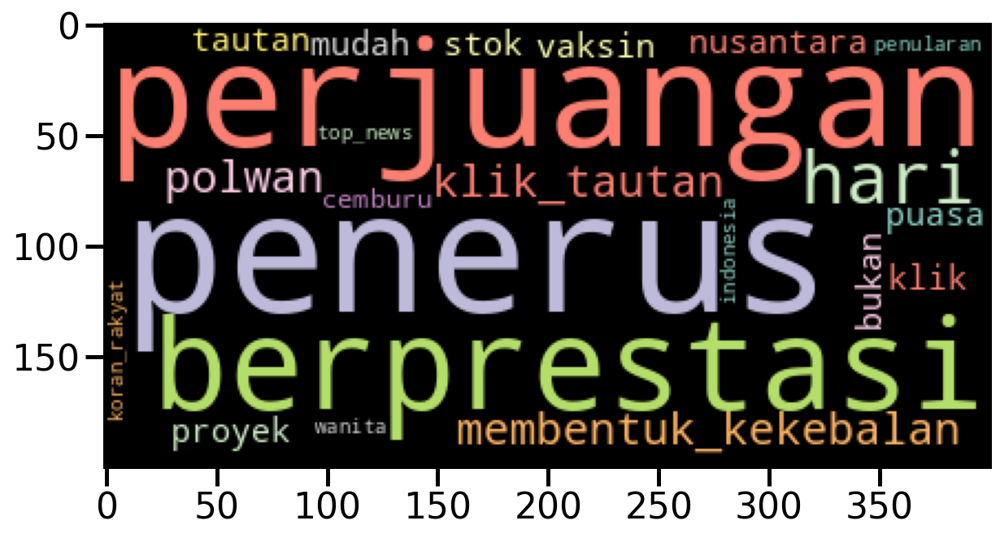

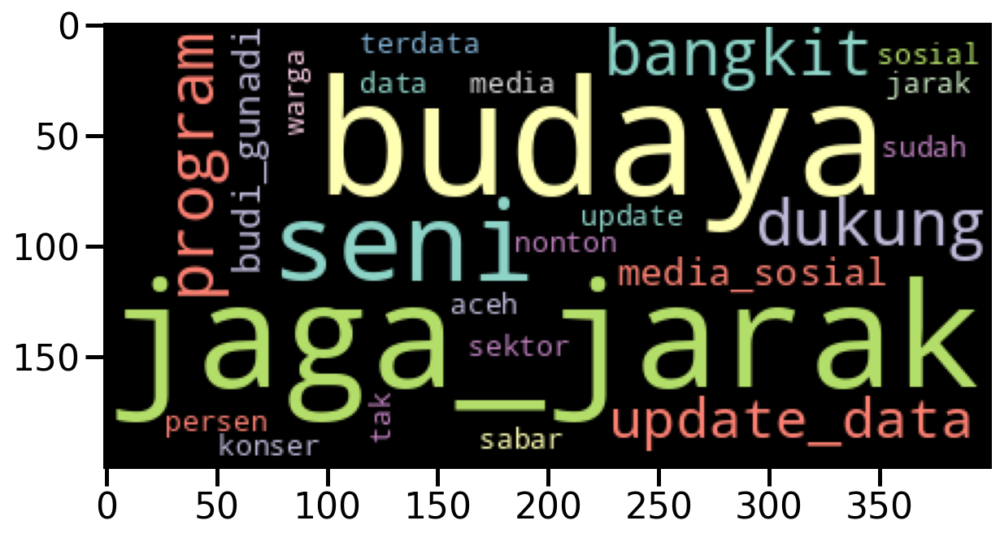

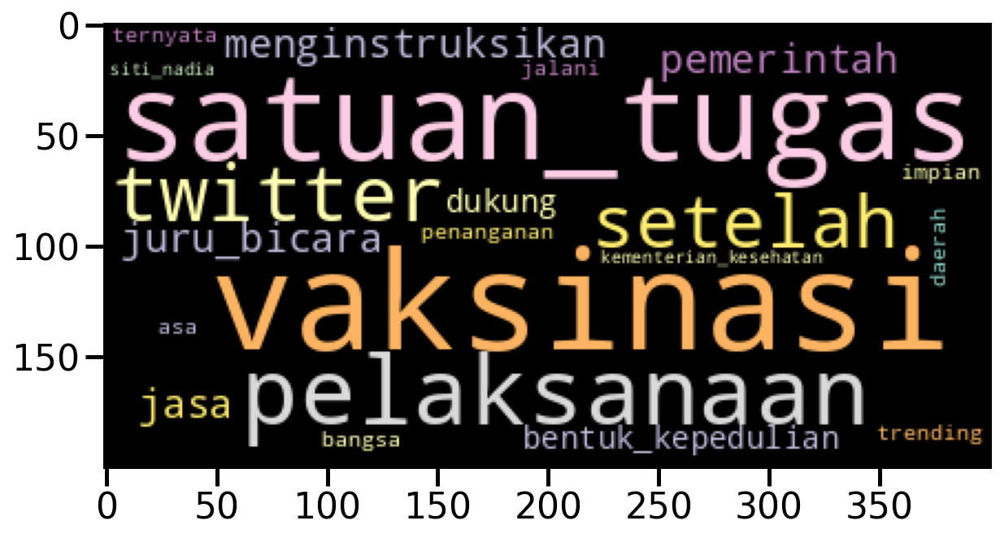

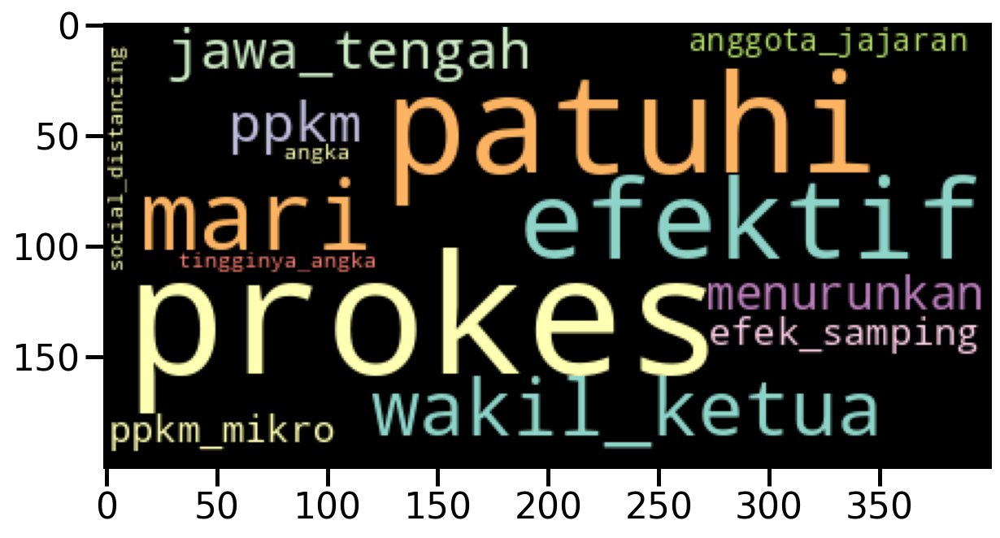

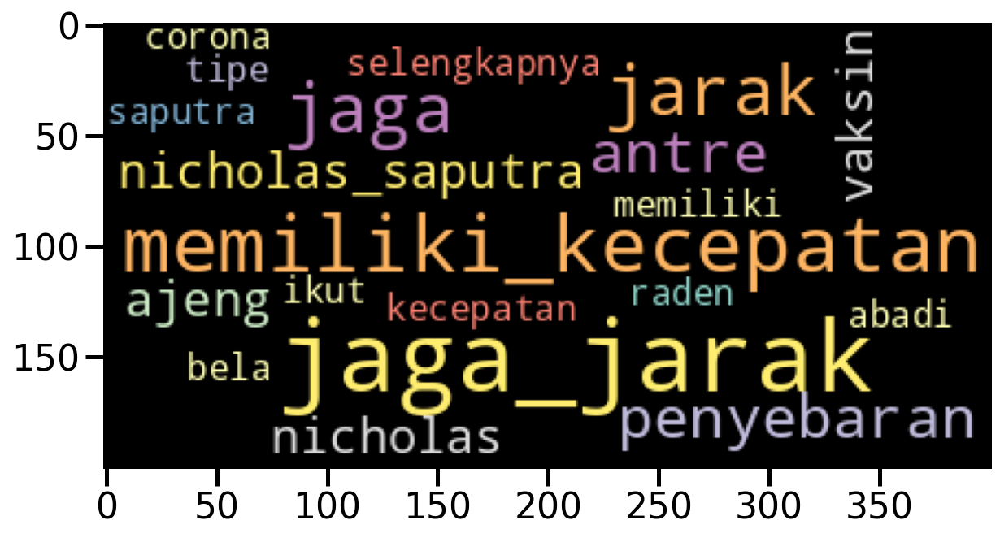

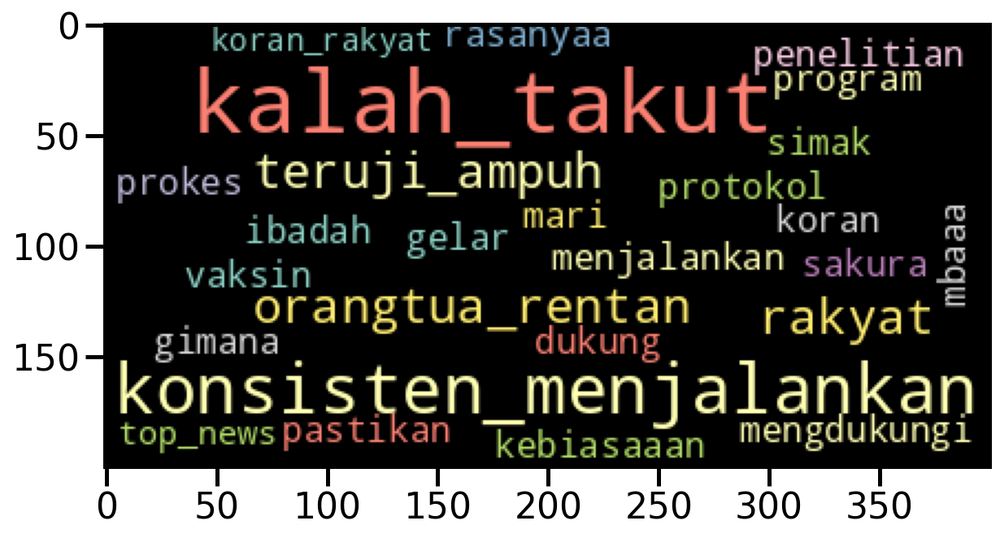

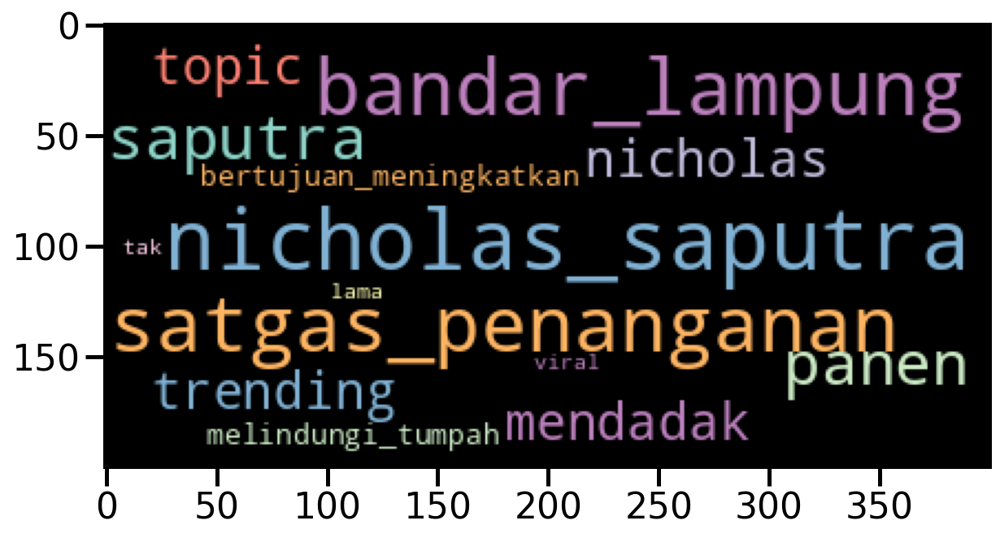

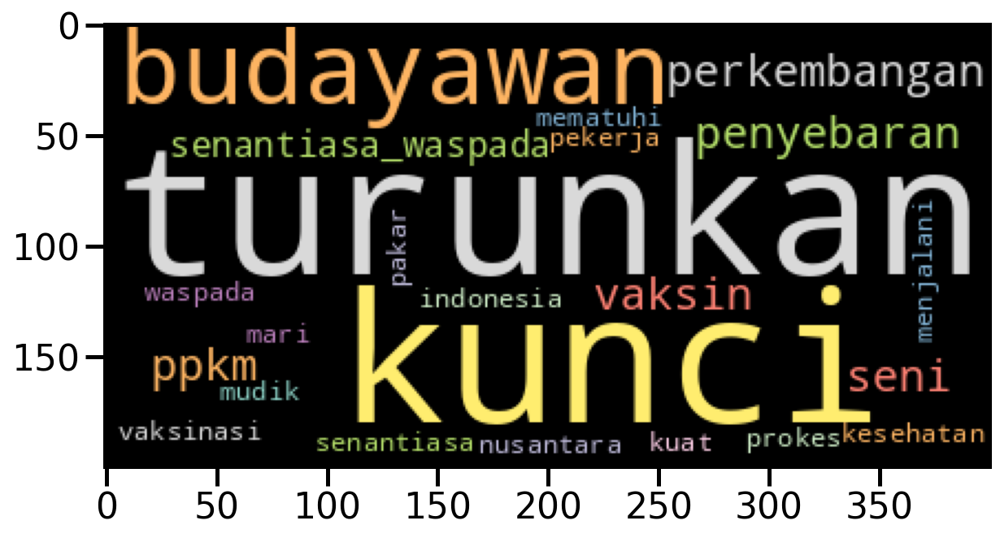

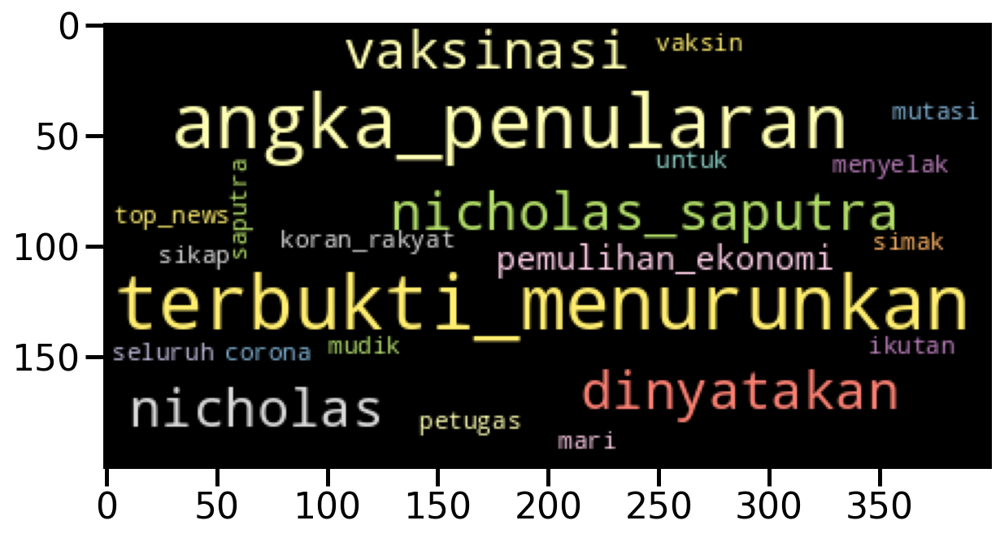

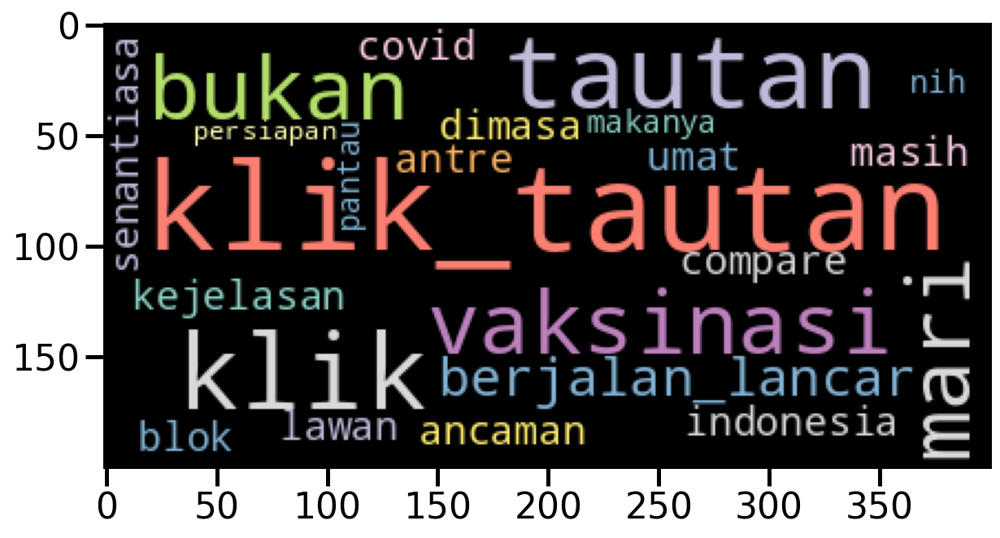

In [68]:
for index, topic in enumerate(model.components_):
    tmps = [vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]]
    teks = " ".join(str(topik) for topik in tmps)
    wcloud = WordCloud(max_words=50, colormap='Set3', background_color='black').generate(teks)
    plt.figure(figsize=(10,5))
    plt.imshow(wcloud)
    plt.show()

In [69]:
topic_model = ldamodel.LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=10, iterations=200) 

In [70]:
# each element of the list is a tuple 
# containing the topic and word / probability list
topics = topic_model.show_topics(num_words = 7, formatted = False)
topics

[(0,
  [('Lansia', 0.021940185),
   ('Alhamdulillah', 0.015136556),
   ('vaksinasi', 0.0148452595),
   ('lansia', 0.014135411),
   ('aman', 0.013663689),
   ('orang', 0.012753318),
   ('terapkan', 0.012458491)]),
 (1,
  [('dukung', 0.041473515),
   ('mari', 0.040369965),
   ('program', 0.034385182),
   ('covid', 0.023363048),
   ('melawan', 0.022799533),
   ('vaksinasi', 0.022796558),
   ('prokes', 0.019771276)]),
 (2,
  [('Top_News', 0.01995862),
   ('Koran_Rakyat', 0.019958617),
   ('Patuhi', 0.017619152),
   ('Mengakhiri_Pandemi', 0.01751125),
   ('Mengakhiri', 0.017086597),
   ('Tetap', 0.015748918),
   ('Dinas_Kesehatan', 0.012633811)]),
 (3,
  [('kesehatan', 0.02093588),
   ('protokol', 0.018237676),
   ('menjaga', 0.016753005),
   ('senantiasa', 0.014797646),
   ('vaksinasi', 0.01431362),
   ('PPKM', 0.013396898),
   ('klik_tautan', 0.013003228)]),
 (4,
  [('indonesia', 0.04107375),
   ('Cepat', 0.022273693),
   ('prokes', 0.016925566),
   ('Prokes', 0.01585946),
   ('Yuk', 0.01

In [71]:
%%time
lda_model = gensim.models.LdaModel(corpus=corpus_tfidf, id2word=dictionary,
                                   chunksize=1740, alpha='auto',
                                   eta='auto', random_state=42,
                                   iterations=500, num_topics=10,
                                   passes=20, eval_every=None)

CPU times: user 45.8 s, sys: 72.1 ms, total: 45.9 s
Wall time: 45.9 s


In [72]:
#Viewing the topics in our trained topic model
for topic_id, topic in lda_model.print_topics(num_topics=10, num_words=7):
    print('Topic #'+str(topic_id+1)+':')
    print(topic)
    print()

Topic #1:
0.032*"Waspada" + 0.030*"Lansia" + 0.027*"tahap" + 0.017*"menjaga" + 0.016*"Sobat_semoga" + 0.015*"mudik" + 0.014*"mencegah"

Topic #2:
0.065*"vaksinasi" + 0.045*"dukung" + 0.045*"program" + 0.037*"Indonesia" + 0.032*"kesehatan" + 0.025*"Tetap" + 0.020*"indonesia"

Topic #3:
0.059*"melawan" + 0.026*"Kunci" + 0.018*"kuat" + 0.017*"menghadapi" + 0.014*"VAKSINASI" + 0.013*"Guru" + 0.012*"upaya"

Topic #4:
0.026*"jaga" + 0.025*"Cepat" + 0.017*"klik_tautan" + 0.017*"ancaman" + 0.014*"Juru_Bicara" + 0.014*"Tenaga" + 0.014*"Sobat"

Topic #5:
0.055*"mari" + 0.025*"yuk" + 0.018*"disiplin" + 0.018*"covid" + 0.015*"protokol" + 0.014*"ragu" + 0.013*"penyebaran"

Topic #6:
0.022*"Jangan" + 0.022*"Dukung" + 0.019*"takut" + 0.017*"Pemerintah" + 0.015*"Program" + 0.015*"divaksin" + 0.015*"Kota"

Topic #7:
0.050*"prokes" + 0.032*"corona" + 0.019*"senantiasa" + 0.017*"mutasi" + 0.017*"Virus" + 0.016*"varian" + 0.016*"Pelaksanaan"

Topic #8:
0.069*"Adalah_Prokes" + 0.046*"Kunci_Cepat" + 0.031*"

In [74]:
#looking at the output of our LDA topic model
topics_with_wts = [item[0] for item in topics_coherences]
print('LDA Topics with Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([(term, round(wt, 3)) for wt, term in topic])
    print()

LDA Topics with Weights
Topic #1:
[('Ini', 0.019), ('Sudah', 0.019), ('Corona', 0.018), ('Divaksin', 0.018), ('Tak', 0.016), ('AstraZeneca', 0.016), ('Sinovac', 0.016), ('Tahap', 0.014), ('Top_News', 0.013), ('Koran_Rakyat', 0.013), ('Disuntik', 0.013), ('Untuk', 0.012), ('Bisa', 0.012), ('Patuhi', 0.012), ('MUI', 0.011), ('Juta', 0.011), ('Dosis', 0.011), ('selengkapnya', 0.01), ('Warga', 0.01), ('via', 0.01)]

Topic #2:
[('vaksinasi', 0.065), ('dukung', 0.045), ('program', 0.045), ('Indonesia', 0.037), ('kesehatan', 0.032), ('Tetap', 0.025), ('indonesia', 0.02), ('patuhi', 0.019), ('orang', 0.019), ('Covid', 0.019), ('masyarakat', 0.018), ('Ayo', 0.018), ('sehat', 0.018), ('lawan', 0.016), ('covid', 0.014), ('Mari', 0.014), ('bebas', 0.011), ('sukseskan', 0.01), ('ikuti', 0.01), ('dosis', 0.01)]

Topic #3:
[('Jangan', 0.022), ('Dukung', 0.022), ('takut', 0.019), ('Pemerintah', 0.017), ('Program', 0.015), ('divaksin', 0.015), ('Kota', 0.015), ('negara', 0.015), ('pandemi', 0.014), ('P

In [75]:
model = LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=10)
for idx, topic in model.print_topics():
    print('Topic: ({}) word: {}'.format(idx, topic))

Topic: (0) word: 0.035*"indonesia" + 0.018*"dukung" + 0.016*"Bulan" + 0.015*"program" + 0.015*"Dengan" + 0.014*"vaksinasi" + 0.013*"Yuk" + 0.013*"pelaksanaan" + 0.013*"Alhamdulillah" + 0.011*"sehat"
Topic: (1) word: 0.031*"Adalah_Prokes" + 0.031*"AstraZeneca" + 0.023*"Prokes" + 0.022*"melawan" + 0.021*"Kunci_Cepat" + 0.020*"Pandemi" + 0.020*"Ikut" + 0.019*"Kunci" + 0.017*"Lansia" + 0.013*"Saya"
Topic: (2) word: 0.030*"dukung" + 0.028*"lawan" + 0.017*"vaksinasi" + 0.015*"lansia" + 0.014*"menghadapi" + 0.014*"program" + 0.013*"kesehatan" + 0.013*"WHO" + 0.011*"masyarakat" + 0.010*"meningkatkan"
Topic: (3) word: 0.032*"prokes" + 0.020*"mari" + 0.020*"Dukung" + 0.019*"covid" + 0.019*"jaga" + 0.016*"Nusantara" + 0.014*"vaksinasi" + 0.012*"kuat" + 0.011*"negara" + 0.010*"program"
Topic: (4) word: 0.017*"klik_tautan" + 0.017*"varian" + 0.014*"Dinas_Kesehatan" + 0.012*"Budi_Gunadi" + 0.011*"simak" + 0.010*"selengkapnya" + 0.009*"angka" + 0.009*"vaksinasi" + 0.009*"dukung" + 0.009*"Wali_Kota"
T

In [76]:
#viewing the topics as a list of terms without the weights
print('LDA Topics without Weights')
print('='*50)
for idx, topic in enumerate(topics_with_wts):
    print('Topic #'+str(idx+1)+':')
    print([term for wt, term in topic])
    print()

LDA Topics without Weights
Topic #1:
['Ini', 'Sudah', 'Corona', 'Divaksin', 'Tak', 'AstraZeneca', 'Sinovac', 'Tahap', 'Top_News', 'Koran_Rakyat', 'Disuntik', 'Untuk', 'Bisa', 'Patuhi', 'MUI', 'Juta', 'Dosis', 'selengkapnya', 'Warga', 'via']

Topic #2:
['vaksinasi', 'dukung', 'program', 'Indonesia', 'kesehatan', 'Tetap', 'indonesia', 'patuhi', 'orang', 'Covid', 'masyarakat', 'Ayo', 'sehat', 'lawan', 'covid', 'Mari', 'bebas', 'sukseskan', 'ikuti', 'dosis']

Topic #3:
['Jangan', 'Dukung', 'takut', 'Pemerintah', 'Program', 'divaksin', 'Kota', 'negara', 'pandemi', 'Presiden', 'Kesehatan', 'Tidak', 'Ada', 'Masyarakat', 'Jokowi', 'Orang', 'pelaksanaan', 'Jadi', 'Usai', 'Setelah']

Topic #4:
['mari', 'yuk', 'disiplin', 'covid', 'protokol', 'ragu', 'penyebaran', 'virus', 'salah', 'aman', 'Dinas_Kesehatan', 'Kabupaten', 'tubuh', 'bentuk_kepedulian', 'Lampung', 'langkah', 'memiliki', 'lengah', 'Anggota', 'aman_halal']

Topic #5:
['Waspada', 'Lansia', 'tahap', 'menjaga', 'Sobat_semoga', 'mudik', '

In [73]:
#viewing the overall mean coherence score of the model
topics_coherences = lda_model.top_topics(corpus_tfidf, topn=20)
avg_coherence_score = np.mean([item[1] for item in topics_coherences])
print('Avg. Coherence Score:', avg_coherence_score)

Avg. Coherence Score: -15.35609784295952


In [77]:
umass_coherence_model_lda = gensim.models.CoherenceModel(model=lda_model,
                                                         corpus=corpus_tfidf,
                                                         texts=train_komen,
                                                         dictionary=dictionary,
                                                         coherence='u_mass')
avg_coherence_umass = umass_coherence_model_lda.get_coherence()

perplexity = lda_model.log_perplexity(corpus_tfidf)

print('Avg. Coherence Score (UMass):', avg_coherence_umass)
print('Model Perplexity:', perplexity)

Avg. Coherence Score (UMass): -15.35609784295952
Model Perplexity: -8.052945000233544


In [78]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel( corpus=corpus_tfidf, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=lda_model, texts=train_komen, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [79]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus_tfidf, texts=train_komen, start=2, limit=40, step=6)

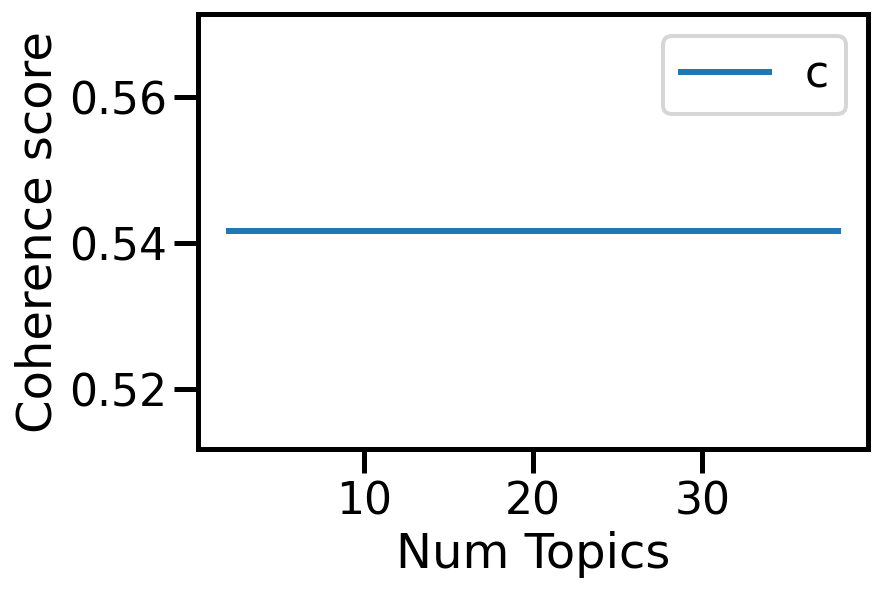

In [80]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [81]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 7))

Num Topics = 2  has Coherence Value of 0.5415987
Num Topics = 8  has Coherence Value of 0.5415987
Num Topics = 14  has Coherence Value of 0.5415987
Num Topics = 20  has Coherence Value of 0.5415987
Num Topics = 26  has Coherence Value of 0.5415987
Num Topics = 32  has Coherence Value of 0.5415987
Num Topics = 38  has Coherence Value of 0.5415987


In [82]:
LDA_viz = pyLDAvis.gensim.prepare(lda_model, corpus_tfidf, dictionary)
pyLDAvis.save_html(LDA_viz, "/home/hanif/LDA.html")

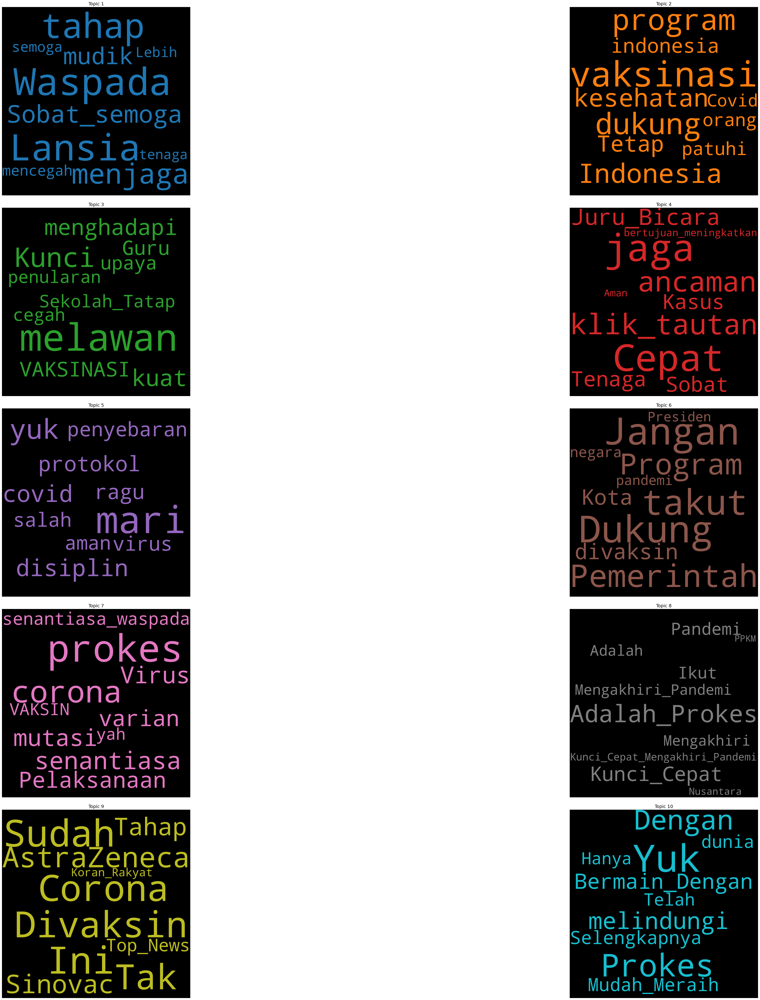

In [83]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'
cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='black',
                  width=2500,
                  height=2500,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)


topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(5, 2, figsize=(80,50), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=500)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i+1), fontdict=dict(size=16))
    plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [84]:
def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

df_topic_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus_tfidf, texts=train_komen)

In [85]:
# Format
df_dominant_topic = df_topic_keywords.reset_index()
df_dominant_topic.columns = ['date', 'Dominant_Topic', 'Topic_Perc_Contrib','keywords', 'title']
df_dominant_topic.date = data.date

# Show
df_dominant_topic.head(10)

,date,Dominant_Topic,Topic_Perc_Contrib,keywords,title
0,2021-01-10 15:13:42,5.0,0.1612,"Jangan, Dukung, takut, Pemerintah, Program, di...",[]
1,2021-01-10 16:14:21,8.0,0.1650,"Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca...","[Tak, Kenal, Tak, Vaksin, bukti, manusia, berj..."
2,2021-01-10 16:33:46,1.0,0.1894,"vaksinasi, dukung, program, Indonesia, kesehat...","[Sistem, data, mendukung, Vaksinasi, Indonesia]"
3,2021-01-10 17:35:47,5.0,0.2096,"Jangan, Dukung, takut, Pemerintah, Program, di...","[menerima, vaksin, covid]"
4,2021-01-11 00:24:53,3.0,0.1715,"jaga, Cepat, klik_tautan, ancaman, Juru_Bicara...","[Apa, Perbedaan, Vaksin, China, Sinovac, Sinop..."
5,2021-01-11 00:30:53,8.0,0.2552,"Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca...","[Dua, Lagi, Obat, Dapat, Selamatkan, Nyawa, Pa..."
6,2021-01-11 01:00:00,8.0,0.2916,"Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca...","[Vaksin, buatan, Tiongkok, orang, tua, video, ..."
7,2021-01-11 01:07:10,7.0,0.1744,"Adalah_Prokes, Kunci_Cepat, Pandemi, Ikut, Ada...","[Kabar, Dokter, Pribadi, Paus, Fransiskus, Men..."
8,2021-01-11 01:41:53,3.0,0.1700,"jaga, Cepat, klik_tautan, ancaman, Juru_Bicara...","[Masker, bekas, rawan, tertular, Pakai, masker..."
9,2021-01-11 01:59:25,4.0,0.1507,"mari, yuk, disiplin, covid, protokol, ragu, pe...","[wakil, supervisor, rumah, sakit, rumah_sakit,..."


In [86]:
df_topics_keyword_sorted = pd.DataFrame()

df_topics_keyword_sorted_grouped = df_topic_keywords.groupby('Dominant_Topic')

for i, grp in df_topics_keyword_sorted_grouped:
    df_topics_keyword_sorted = pd.concat([df_topics_keyword_sorted, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
df_topics_keyword_sorted.reset_index(drop=True, inplace=True)

# Format
df_topics_keyword_sorted.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
df_topics_keyword_sorted.head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.2566,"Waspada, Lansia, tahap, menjaga, Sobat_semoga,...","[Topik, Diskusi, Pagi, Menyukseskan, Antara, H..."
1,1.0,0.3382,"vaksinasi, dukung, program, Indonesia, kesehat...","[semangat, kebersamaan, mempedulikan, orang, m..."
2,2.0,0.2220,"melawan, Kunci, kuat, menghadapi, VAKSINASI, G...","[Sampurasun, wargi, Jabar, yahu, perkembangan,..."
3,3.0,0.2393,"jaga, Cepat, klik_tautan, ancaman, Juru_Bicara...","[KODIM, BANGLI, PERKETAT, PROTOKOL, KESEHATAN,..."
4,4.0,0.3109,"mari, yuk, disiplin, covid, protokol, ragu, pe...","[Polsek, Kalibagor, Jaga, Sinovac, RSiA, Bunda..."


/home/hanif/miniconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/hanif/miniconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/hanif/miniconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/home/hanif/miniconda3/lib/python3.8/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


In [87]:
temp_list = [] # A temp variable for us to form a dataframe

for x in range(df_dominant_topic.shape[0]): # For all the documents
    new_doc = train_komen[x] # Get the content of document (already preprocessed)
    new_doc_bow = dictionary.doc2bow(new_doc) # Form a BOW
    temp = lda_model.get_document_topics(new_doc_bow, minimum_probability=0.0) # Get the doc-topic dist
    temp_list.append([round(n,5) for _, n in temp]) # Add in all the probabilities

# Create Dataframe for our probabilities
doc_topic_df_prob = pd.DataFrame(temp_list)

# Get a copy of the original table containing document and their contents
df_original_copy = df_dominant_topic

# Merge the 2 dataframe together
doc_topic_table = pd.concat([df_original_copy, doc_topic_df_prob], axis=1)

# Remove certain rows for a more concise table
doc_topic_table = doc_topic_table[[col for col in doc_topic_table.columns if col not in 
                                       ['Dominant_Topic','Topic_Perc_Contrib','title']]]
# Renaming columns
doc_topic_table.rename(columns={0: "Topic 1", 1: "Topic 2", 2: "Topic 3", 3: "Topic 4", 4: "Topic 5", 5: "Topic 6", 6: "Topic 7", 7: "Topic 8", 8: "Topic 9", 9: "Topic 10"},
                       inplace=True)
# Display the table
doc_topic_table

,date,keywords,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10
0,2021-01-10 15:13:42,"Jangan, Dukung, takut, Pemerintah, Program, di...",0.08379,0.15529,0.06872,0.07327,0.12781,0.16118,0.06829,0.06005,0.14668,0.05491
1,2021-01-10 16:14:21,"Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca...",0.11388,0.09893,0.04378,0.04668,0.14187,0.10268,0.04350,0.03826,0.21444,0.15596
2,2021-01-10 16:33:46,"vaksinasi, dukung, program, Indonesia, kesehat...",0.06073,0.25021,0.04981,0.05311,0.09264,0.18564,0.04949,0.04353,0.17504,0.03980
3,2021-01-10 17:35:47,"Jangan, Dukung, takut, Pemerintah, Program, di...",0.07042,0.17002,0.05775,0.06157,0.14771,0.21526,0.05739,0.05047,0.12327,0.04614
4,2021-01-11 00:24:53,"jaga, Cepat, klik_tautan, ancaman, Juru_Bicara...",0.05338,0.09893,0.04378,0.22812,0.08143,0.16318,0.04350,0.03826,0.21444,0.03498
...,...,...,...,...,...,...,...,...,...,...,...,...
13486,2021-04-20 15:42:48,"Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca...",0.06522,0.12087,0.20126,0.05703,0.09948,0.12546,0.05315,0.04674,0.18804,0.04274
13487,2021-04-20 19:00:00,"Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca...",0.05034,0.09329,0.09832,0.04401,0.07678,0.15385,0.04102,0.03608,0.37333,0.03298
13488,2021-04-20 20:37:37,"Jangan, Dukung, takut, Pemerintah, Program, di...",0.08379,0.15529,0.06872,0.07327,0.12781,0.16118,0.06829,0.06005,0.14668,0.05491
13489,2021-04-20 20:46:53,"Jangan, Dukung, takut, Pemerintah, Program, di...",0.06522,0.19478,0.12737,0.05703,0.09948,0.19933,0.05315,0.04674,0.11417,0.04274


In [88]:
order = [i for i in df_topics_keyword_sorted.Keywords]
order

['Waspada, Lansia, tahap, menjaga, Sobat_semoga, mudik, mencegah, semoga, Lebih, tenaga',
 'vaksinasi, dukung, program, Indonesia, kesehatan, Tetap, indonesia, patuhi, orang, Covid',
 'melawan, Kunci, kuat, menghadapi, VAKSINASI, Guru, upaya, Sekolah_Tatap, cegah, penularan',
 'jaga, Cepat, klik_tautan, ancaman, Juru_Bicara, Tenaga, Sobat, Kasus, bertujuan_meningkatkan, Aman',
 'mari, yuk, disiplin, covid, protokol, ragu, penyebaran, virus, salah, aman',
 'Jangan, Dukung, takut, Pemerintah, Program, divaksin, Kota, negara, pandemi, Presiden',
 'prokes, corona, senantiasa, mutasi, Virus, varian, Pelaksanaan, senantiasa_waspada, VAKSIN, yah',
 'Adalah_Prokes, Kunci_Cepat, Pandemi, Ikut, Adalah, Mengakhiri_Pandemi, Mengakhiri, Kunci_Cepat_Mengakhiri_Pandemi, Nusantara, PPKM',
 'Ini, Sudah, Corona, Divaksin, Tak, AstraZeneca, Sinovac, Tahap, Top_News, Koran_Rakyat',
 'Yuk, Prokes, Dengan, melindungi, Bermain_Dengan, Selengkapnya, Mudah_Meraih, dunia, Telah, Hanya']

In [90]:
list_of_docs = []
for i in range(1,11):
    temp = doc_topic_table[['date','keywords','Topic %s' %i]]
    temp.rename(columns={'Topic %s' %i: "share"}, inplace = True)
    list_of_docs.append(temp)
df = pd.concat(list_of_docs)
df.keywords = [i for i in order for j in range(13491)]
df.rename(columns={'keywords': 'topic_keywords','Document_No': 'date'}, inplace=True)

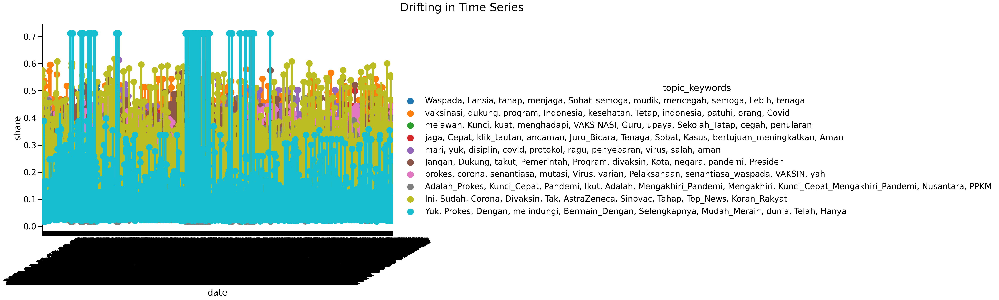

In [92]:
p = sns.factorplot(x="date", y='share', kind='point', hue_order=order, hue='topic_keywords',size=10, aspect=1.8, data=df)
p.fig.subplots_adjust(top=0.9)
p.fig.suptitle('Drifting in Time Series', fontsize=30)
p.set_xticklabels(rotation=30)
p

In [93]:
df.to_csv('/home/hanif/new_indonesian_vaccination_tweets.csv')
df.to_html('/home/hanif/new_indonesian_vaccination_tweets.html')

In [96]:
x = datetime.datetime.now()
print(x)

2021-12-06 19:15:09.030886
